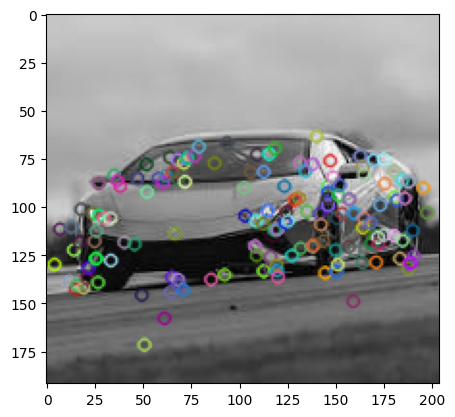

In [6]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
img = cv.imread('/content/download (2).jpg')
gray= cv.cvtColor(img,cv.COLOR_BGR2GRAY)
sift = cv.SIFT_create()
kp = sift.detect(gray,None)
img=cv.drawKeypoints(gray,kp,img)
cv.imwrite('sift_keypoints.jpg',img)
plt.imshow(img)

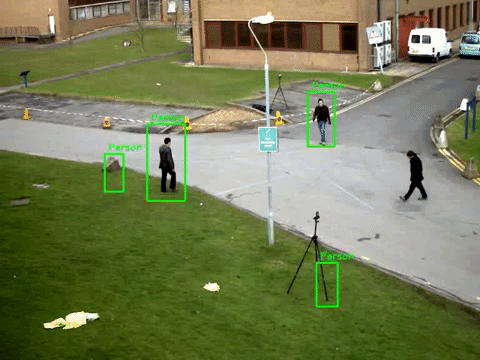

In [1]:
import cv2
from imutils.object_detection import non_max_suppression 

filename = 'street.mp4'
file_size = (1920,1080) # Assumes 1920x1080 mp4
scale_ratio = 1 # Option to scale to fraction of original size. 
 
# We want to save the output to a video file
output_filename = 'pedestrians_on_street.mp4'
output_frames_per_second = 20.0
def main():

  # Create a HOGDescriptor object
  hog = cv2.HOGDescriptor()

  # Initialize the People Detector
  hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

  # Load an image
  image = cv2.VideoCapture(filename)

  # Detect people
  # image: Source image
  # winStride: step size in x and y direction of the sliding window
  # padding: no. of pixels in x and y direction for padding of sliding window
  # scale: Detection window size increase coefficient
  # bounding_boxes: Location of detected people
  # weights: Weight scores of detected people
  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  result = cv2.VideoWriter(output_filename,  
                           fourcc, 
                           output_frames_per_second, 
                           file_size) 
  (bounding_boxes, weights) = hog.detectMultiScale(image,
                                                   winStride=(4, 4),
                                                   padding=(8, 8),
                                                   scale=1.05)

  # Draw bounding boxes on the image
  for (x, y, w, h) in bounding_boxes:
    cv2.rectangle(image,
                  (x, y),
                  (x + w, y + h),
                  (0, 0, 255),
                   4)

  # Create the output file name by removing the '.jpg' part
  # size = len(filename)
  # new_filename = filename[:size - 4]
  # new_filename = new_filename + '_detect.jpg'

  # Save the new image in the working directory
  # cv2.imwrite(new_filename, image)
  image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  # Display the image
  plt.imshow( image)

  # Display the window until any key is pressed
  cv2.waitKey(0)

  # Close all windows
  cv2.destroyAllWindows()

main()

error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\core\src\matrix.cpp:246: error: (-215:Assertion failed) s >= 0 in function 'cv::setSize'


# HOG Algorithm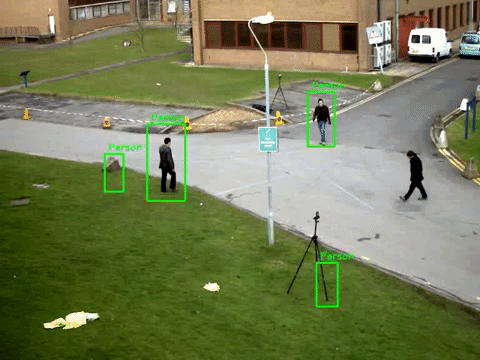

In [9]:
import cv2 # Import the OpenCV library to enable computer vision
import numpy as np # Import the NumPy scientific computing library
from imutils.object_detection import non_max_suppression # Handle overlapping
 
# Make sure the video file is in the same directory as your code
filename = 'street.mp4'
file_size = (1920,1080) # Assumes 1920x1080 mp4
scale_ratio = 1 # Option to scale to fraction of original size. 
 
# We want to save the output to a video file
output_filename = 'pedestrians_on_street.mp4'
 
def main():
 
  # Create a HOGDescriptor object
  hog = cv2.HOGDescriptor()
     
  # Initialize the People Detector
  hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
     
  # Load a video
  cap = cv2.VideoCapture(filename)
 
  # Create a VideoWriter object so we can save the video output
  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  result = cv2.VideoWriter(output_filename,  
                           fourcc, 
                           40, 
                           file_size) 
     
  # Process the video
  while cap.isOpened():
         
    # Capture one frame at a time
    success, frame = cap.read() 
         
    # Do we have a video frame? If true, proceed.
    if success:
         
        # Resize the frame
      width = int(frame.shape[1] * scale_ratio)
      height = int(frame.shape[0] * scale_ratio)
      frame = cv2.resize(frame, (width, height))
             
      # Store the original frame
      orig_frame = frame.copy()
             
      # Detect people
      # image: a single frame from the video
      # winStride: step size in x and y direction of the sliding window
      # padding: no. of pixels in x and y direction for padding of 
      # sliding window
      # scale: Detection window size increase coefficient   
      # bounding_boxes: Location of detected people
      # weights: Weight scores of detected people
      # Tweak these parameters for better results
      (bounding_boxes, weights) = hog.detectMultiScale(frame, 
                                                       winStride=(16, 16),
                                                       padding=(4, 4), 
                                                       scale=1.05)
 
      # Draw bounding boxes on the frame
      for (x, y, w, h) in bounding_boxes: 
            cv2.rectangle(orig_frame, 
            (x, y),  
            (x + w, y + h),  
            (0, 0, 255), 
             2)
                         
      # Get rid of overlapping bounding boxes
      # You can tweak the overlapThresh value for better results
      bounding_boxes = np.array([[x, y, x + w, y + h] for (
                                x, y, w, h) in bounding_boxes])
             
      selection = non_max_suppression(bounding_boxes, 
                                      probs=None, 
                                      overlapThresh=0.45)
         
      # draw the final bounding boxes
      for (x1, y1, x2, y2) in selection:
        cv2.rectangle(frame, 
                     (x1, y1), 
                     (x2, y2), 
                     (0, 255, 0), 
                      4)
         
      # Write the frame to the output video file
      result.write(frame)
             
      # Display the frame 
      cv2.imshow("Frame", frame)    
 
      # Display frame for X milliseconds and check if q key is pressed
      # q == quit
      if cv2.waitKey(25) & 0xFF == ord('q'):
        break
         
    # No more video frames left
    else:
      break
             
  # Stop when the video is finished
  cap.release()
     
  # Release the video recording
  result.release()
     
  # Close all windows
  cv2.destroyAllWindows() 
 
main()